In [3]:
from numba import vectorize, complex128, int64
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import os

@vectorize([int64(complex128, complex128, int64)], target='cpu')
def compute_julia(z, c, max_iters):
    """Compute the Julia set value for a given complex number."""
    for i in range(max_iters):
        z = z**2 + c
        if z.real**2 + z.imag**2 > 4.0:
            return i
    return 0

def julia(x, y, size, width, height, c, max_iters, cmap='viridis', dpi=450, save=True):
    """Plot the Julia set for the given range of the complex plane."""
    
    # Calculate the xmin, xmax, ymin, and ymax values
    xmin = x - size / 2
    xmax = x + size / 2
    ymin = y - size / 2
    ymax = y + size / 2
    
    def calc_figsize(width, height, dpi=dpi):
        """Calculate the figsize values for a given width and height of the desired image."""
        figsize = (width / float(dpi), height / float(dpi))
        return figsize

    # Set up the grid of complex numbers to iterate over
    xx, yy = np.meshgrid(np.linspace(xmin, xmax, width), np.linspace(ymin, ymax, height))
    z = xx + 1j * yy
    
    # Compute the Julia set for each point in the grid
    julia_set = compute_julia(z, c, max_iters)
    julia_set = julia_set.reshape(z.shape)
    
    # Plot the image
    fig, ax = plt.subplots(figsize=calc_figsize(width, height, dpi=dpi), dpi=dpi)
    ax.xaxis.set_major_locator(ticker.MaxNLocator(20))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(20))
    
    # Rotate x tick labels
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
        
    ax.imshow(julia_set.T, cmap=cmap, extent=[xmin, xmax, ymin, ymax])
    filename = f'x{x}_y{y}_size{size}_w{width}_h{height}_c{c}_{cmap}.png'
    filepath = os.path.join('./fractal_images', filename)
    if save:
        plt.savefig(filepath)
    plt.show()


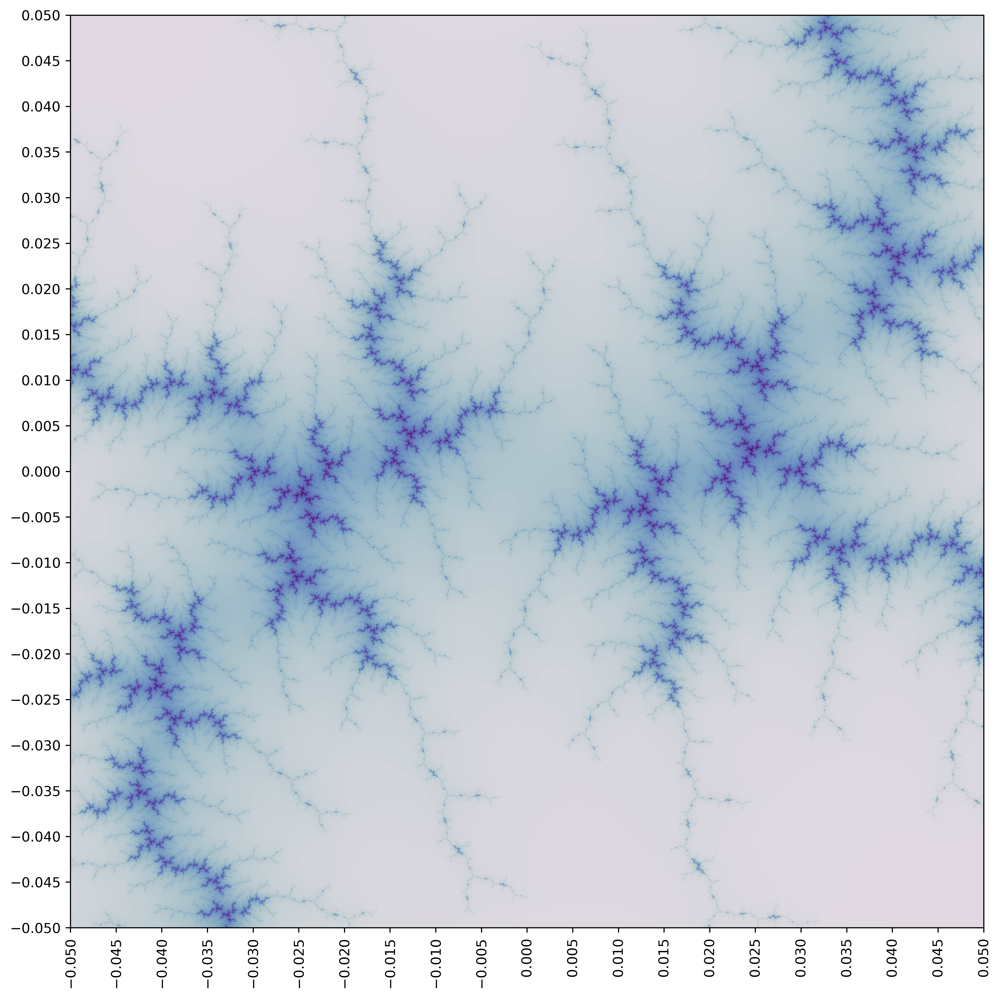

In [32]:
julia(0, 0, .1, 5500, 5500, -.162 + 1.04j, 1000, cmap='twilight', save=False)

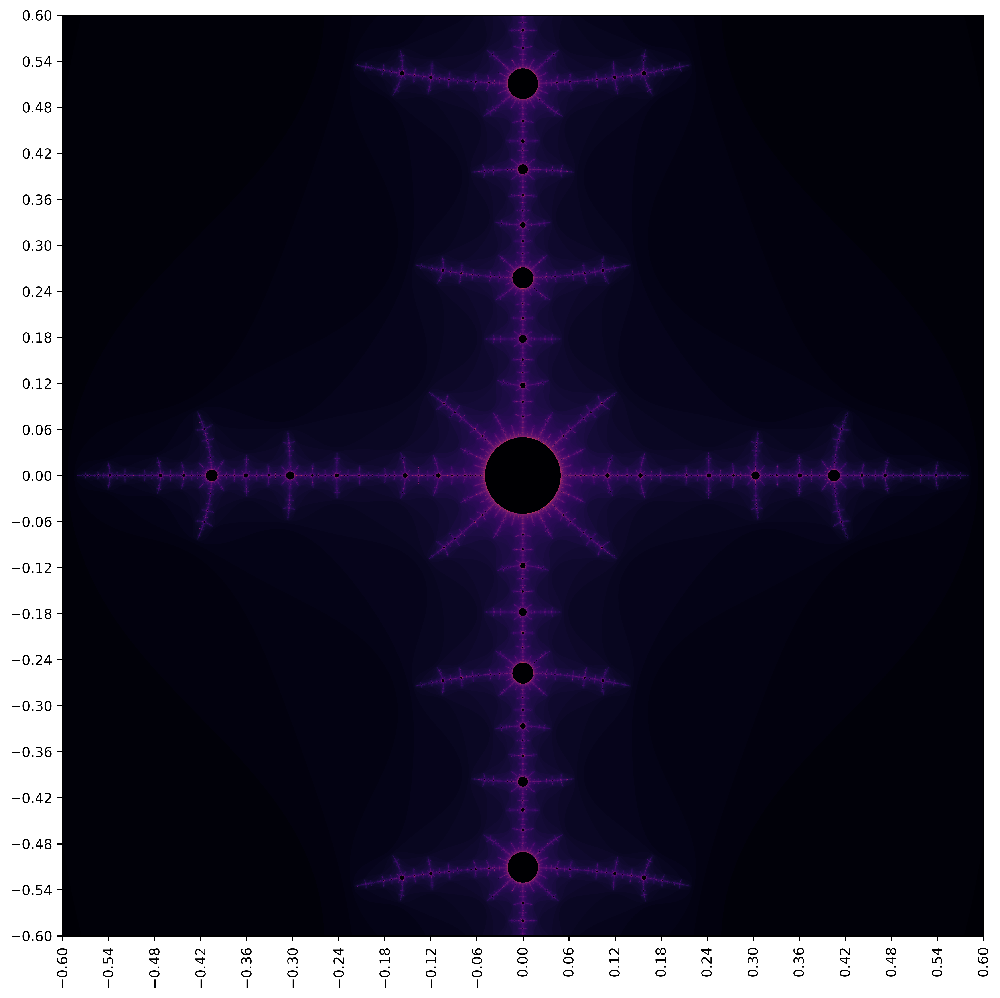

In [145]:
julia(0, 0, 1.2, 5500, 5500, -1.476 + 0.0j, 1000, cmap='inferno', save=False)

### With custom colormap

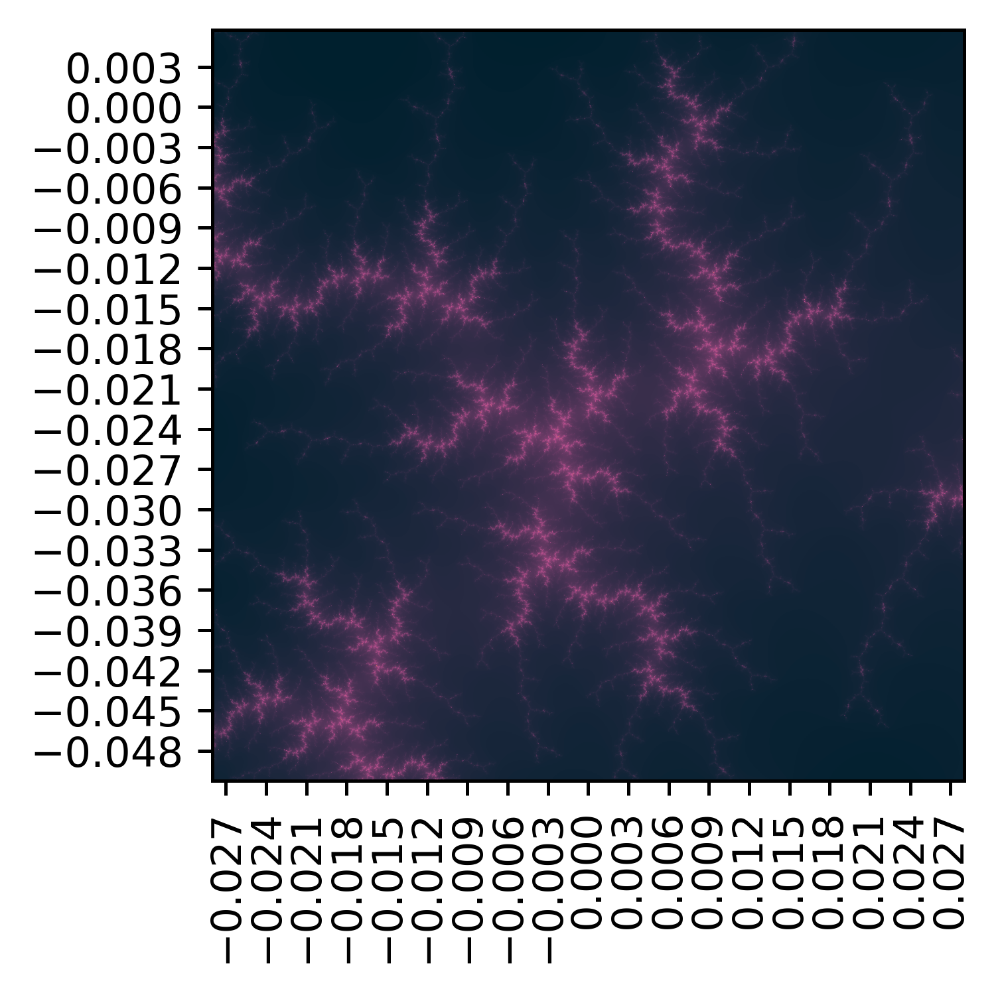

In [12]:
import matplotlib.colors as mcolors

colors = ['#00202e', '#bc5090', '#ffa600']
n_colors = 256
cmap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors, N=n_colors)

julia(0, -0.022222223, .056, 1500, 1500, -.162 + 1.04j, 1000, cmap=cmap, save=False)